In [1]:
import thesis
import geomappy as mp
from geomappy.colors import cmap_2d, cmap_discrete
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

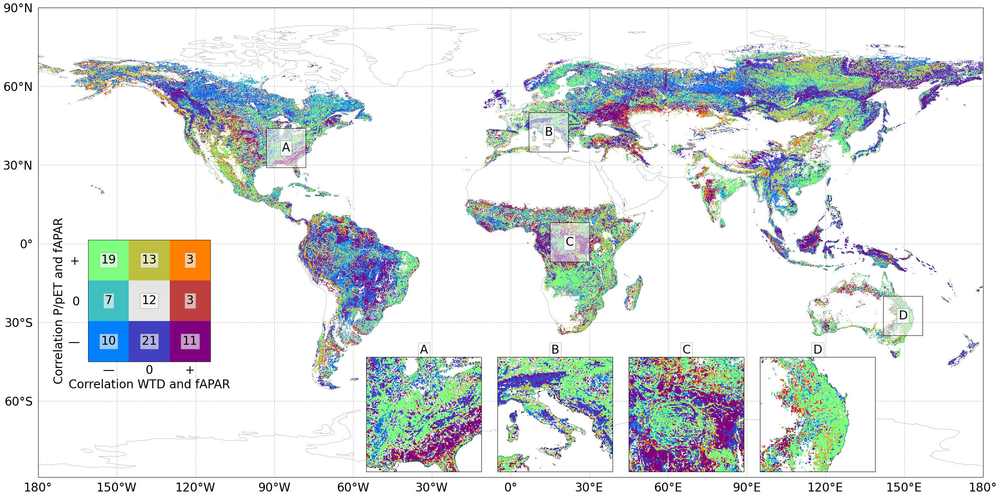

In [2]:
loc = "data/cmap_2d_significant/classes_serial_downsampled_10.tif"

cmap = cmap_2d((3, 3), alpha=0.5, diverging_alpha=0.25)
cmap[1, 1, :] = (0.9, 0.9, 0.9)
cmap = cmap.reshape((9, 3))

thesis.draw_thesis_map(loc, legend_2d=True, legend=None, colors=cmap, classified=True)
plt.savefig("figures/classes.png", bbox_inches='tight', pad_inches=0.0, dpi=300)

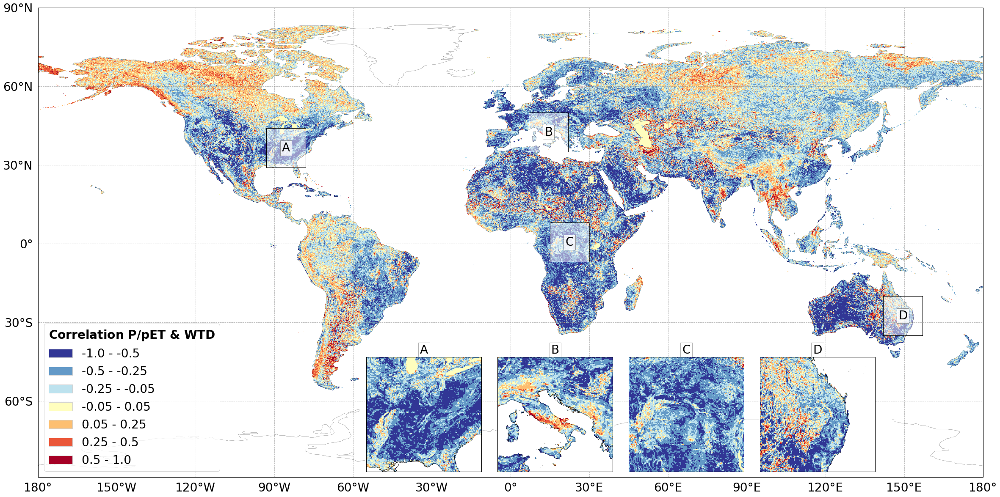

In [3]:
loc = "data/correlation_p_pet_wtd/correlation_p_pet_wtd_15_downsampled_10.tif"
bins = [-1, -0.5, -0.25, -0.05, 0.05, 0.25, 0.5, 1]
thesis.draw_thesis_map(loc, classified=False, legend="legend", bins=bins, cmap="RdYlBu_r", 
                       legend_kwargs={'loc':'lower left', 'fontsize':28, 'title': '$\\bf{Correlation\ P/pET\ &\ WTD}$'})
plt.savefig("figures/si_correlation_p_pet_wtd.png", bbox_inches='tight', pad_inches=0.0, dpi=300)

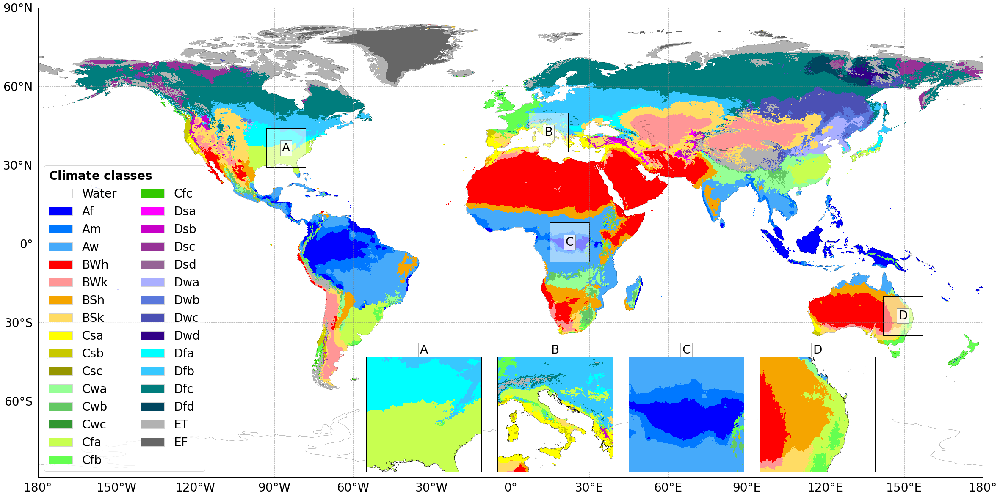

In [4]:
loc = "data/climate/climate_downsampled_10_display.tif"
cmap = [(1, 1, 1)]
bins = [0]
labels = ["Water"]
with open("/Volumes/Elements SE/Thesis/Data/climate/koppen_legend.txt") as f:
    for line in f:
        line = line.strip()
        try:
            int(line[0])
            rgb = [int(c) / 255 for c in line[line.find('[') + 1:-1].split()]
            cmap.append(rgb)
            labels.append(line.split()[1])
            bins.append(line[:line.find(':')])
        except:
            pass
bins = np.array(bins, dtype = np.int)
thesis.draw_thesis_map(loc, classified=True, legend="legend", bins=bins, cmap="RdYlBu", colors=cmap, labels=labels,
                       legend_kwargs={'loc':'lower left', 'ncol':2, 'fontsize':28, 'title': '$\\bfClimate\ classes$'})
plt.savefig("figures/si_climate.png", bbox_inches='tight', pad_inches=0.0, dpi=300)

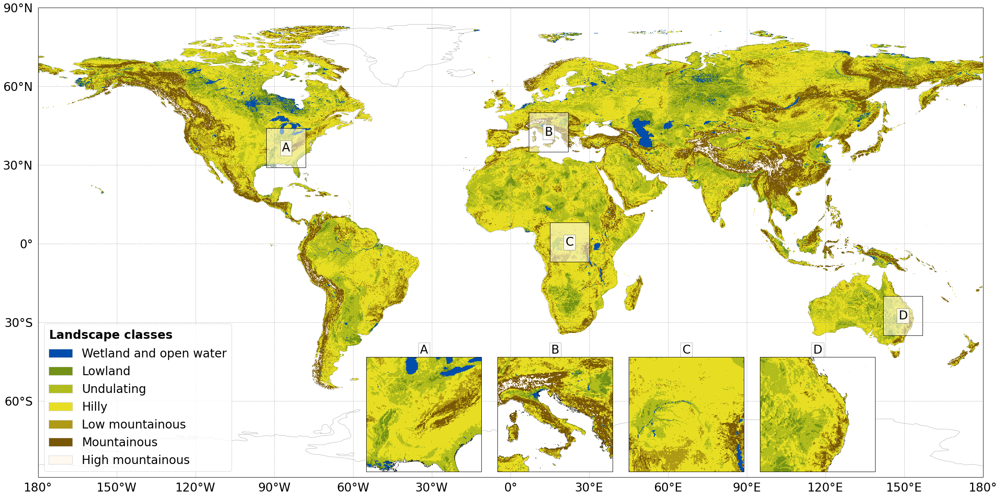

In [5]:
loc = "data/landscape_classes/landscape_downsampled_10_display.tif"
colors = ['#004dac', '#729116', '#b1bc1d', '#e7de23', '#af9a15', '#785707', '#fff9f2']
labels = ['Wetland and open water', 'Lowland', 'Undulating', 'Hilly', 'Low mountainous', 'Mountainous', 'High mountainous']
thesis.draw_thesis_map(loc, classified=True, labels=labels, bins=[1,2,3,4,5,6,7], colors=colors, legend='legend',
    legend_kwargs={'loc':'lower left', 'fontsize':28, 'title': "$\\bf{Landscape \ classes}$"})
plt.savefig("figures/si_landscape.png", bbox_inches='tight', pad_inches=0.0, dpi=300)

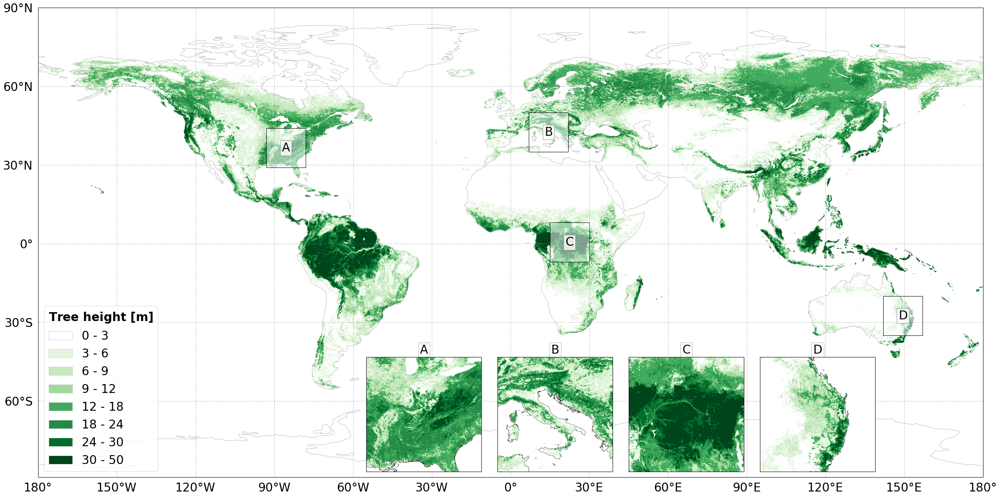

In [6]:
loc = "data/tree_height/tree_height_global_downsampled_10.tif"
bins = [0,3,6,9,12,18,24,30,50]
cmap = ListedColormap(np.vstack(((1,1,1,1), cmap_discrete(n=len(bins), cmap="Greens", return_type='list')[1:])))
thesis.draw_thesis_map(loc, classified=False, bins=bins, cmap=cmap, legend='legend',
    legend_kwargs={'loc':'lower left', 'fontsize':28, 'title': "$\\bf{Tree \ height\ [m]}$"})
plt.savefig("figures/si_tree_height.png", bbox_inches='tight', pad_inches=0.0, dpi=300)

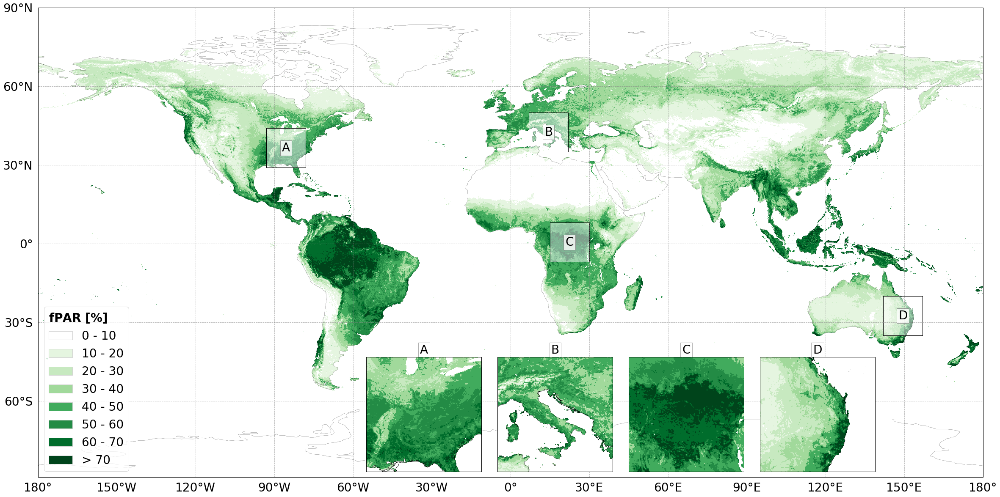

In [7]:
loc = "data/fapar/mean_fpar_downsampled_10.tif"
bins = [0, 10, 20, 30, 40, 50, 60, 70]
colors = ListedColormap(np.vstack(((1,1,1,1), cmap_discrete(n=len(bins), cmap="Greens", return_type = 'list')[1:])))
thesis.draw_thesis_map(loc, classified=False, bins=bins, cmap=cmap, legend='legend',
    legend_kwargs={'loc':'lower left', 'fontsize':28, 'title': "$\\bf{fPAR\ [\%]}$"})
plt.savefig("figures/si_fapar.png", bbox_inches='tight', pad_inches=0.0, dpi=300)    

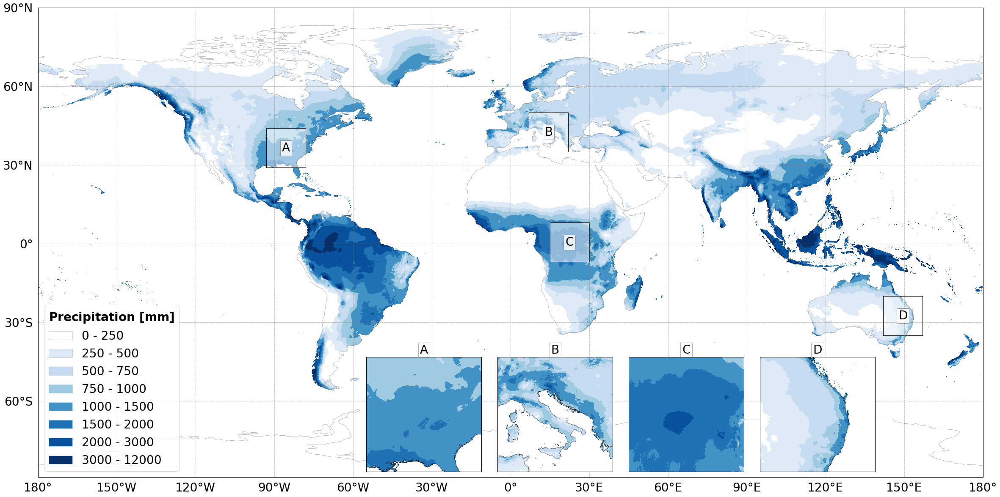

In [8]:
loc = "data/precipitation/precipitation_downsampled_10.tif"
bins = [0,250,500,750,1000,1500,2000,3000, 12000]
cmap = ListedColormap(np.vstack(((1,1,1,1), cmap_discrete(n=len(bins), cmap="Blues", return_type = 'list')[1:])))
thesis.draw_thesis_map(loc, classified=False, bins=bins, cmap=cmap, legend='legend',
    legend_kwargs={'loc':'lower left', 'fontsize':28, 'title': "$\\bf{Precipitation\ [mm]}$"})
plt.savefig("figures/si_precipitation.png", bbox_inches='tight', pad_inches=0.0, dpi=300)    

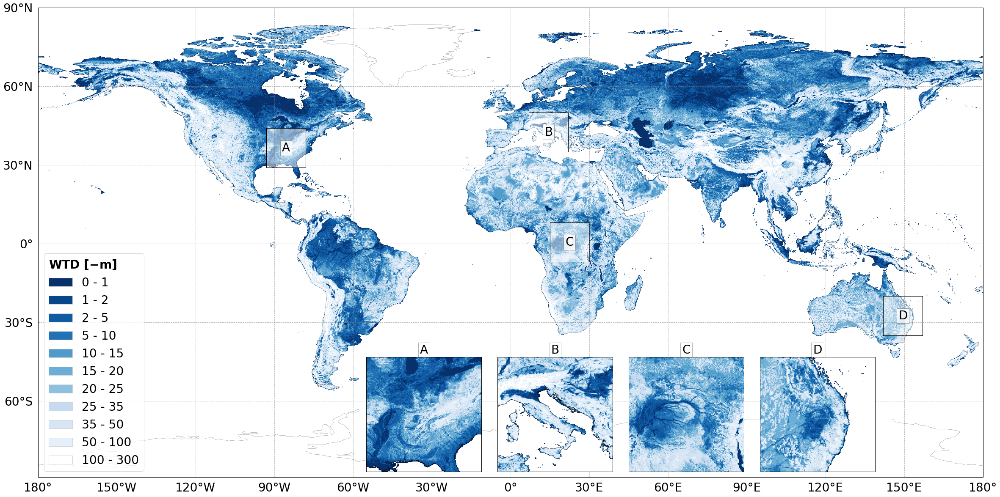

In [9]:
loc = "data/wtd/wtd_downsampled_10.tif"
bins = [0,1,2,5,10,15,20,25,35,50,100,300]
labels = [f"{bins[i-1]} - {bins[i]}" for i in range(1,len(bins))][::-1]
cmap = ListedColormap(np.vstack(((1,1,1,1), cmap_discrete(n=len(bins)+1, cmap="Blues", return_type='list')[1:])))
bins = [-x for x in bins]
ax, legend = thesis.draw_thesis_map(loc, classified=False, bins=bins, cmap=cmap, legend='legend', bin_labels=labels)
labels, handles = legend.texts, legend.legendHandles
labels = [label._text for label in labels]
leg = plt.gcf().axes[0].legend(handles[::-1], labels[::-1], fontsize=28, title="$\\bf{WTD\ [-m]}$", 
                              title_fontsize=28, loc='lower left')
leg._legend_box.align = "left"
plt.savefig("figures/si_wtd.png", bbox_inches='tight', pad_inches=0.0, dpi=300)    

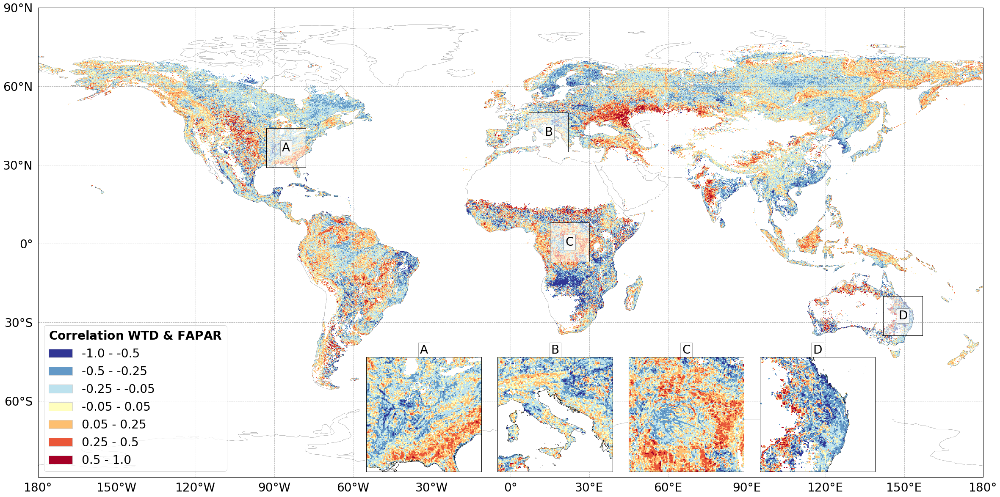

In [10]:
loc = "data/correlation_wtd_fapar/correlation_wtd_fapar_ge3_15_downsampled_10.tif"
bins = [-1, -0.5, -0.25, -0.05, 0.05, 0.25, 0.5, 1]
thesis.draw_thesis_map(loc, classified=False, legend="legend", bins=bins, cmap="RdYlBu_r",  
  legend_kwargs={'loc':'lower left', 'fontsize':28, 'title': "$\\bf{Correlation\ WTD\ &\ FAPAR}$"})
plt.savefig("figures/si_corr_wtd_fapar.png", bbox_inches='tight', pad_inches=0.0, dpi=300)    

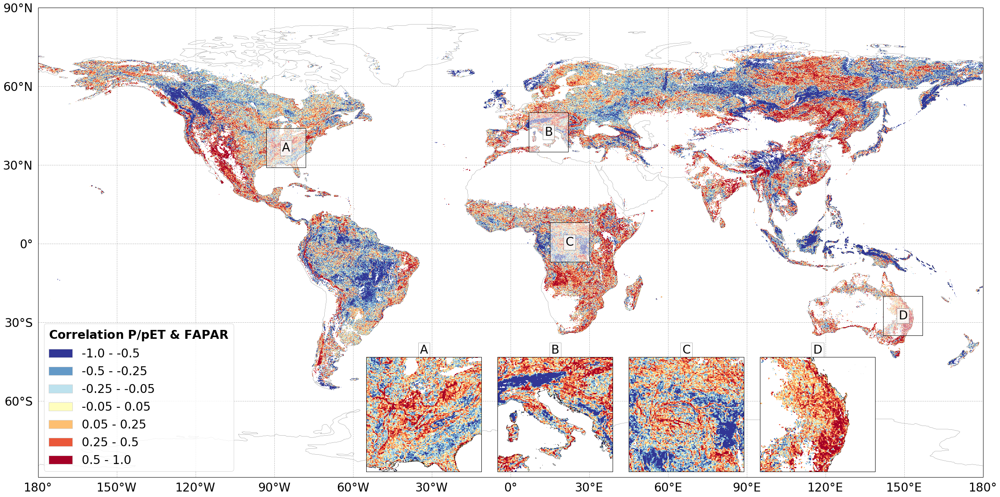

In [11]:
loc = "data/correlation_p_pet_fapar/correlation_p_pet_fapar_ge3_15_downsampled_10.tif"
bins = [-1, -0.5, -0.25, -0.05, 0.05, 0.25, 0.5, 1]
thesis.draw_thesis_map(loc, classified=False, legend="legend", bins=bins, cmap="RdYlBu_r",  
  legend_kwargs={'loc':'lower left', 'fontsize':28, 'title': "$\\bf{Correlation\ P/pET\ &\ FAPAR}$"})
plt.savefig("figures/si_corr_p_pet_fapar.png", bbox_inches='tight', pad_inches=0.0, dpi=300)    

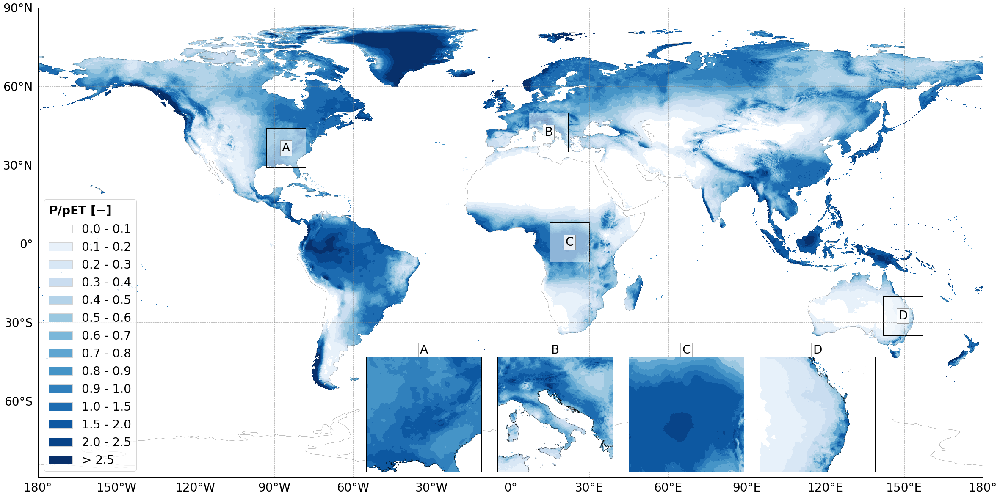

In [12]:
loc = "data/pet/p_pet_downsampled_10.tif"
bins = [0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1,1.5,2,2.5]
cmap = ListedColormap(np.vstack(((1,1,1,1), cmap_discrete(n=len(bins), cmap="Blues", return_type = 'list')[1:])))
thesis.draw_thesis_map(loc, classified=False, bins=bins, cmap=cmap, legend='legend',
    legend_kwargs={'loc':'lower left', 'fontsize':28, 'title': "$\\bf{P/pET\ [-]}$"})
plt.savefig("figures/si_p_pet.png", bbox_inches='tight', pad_inches=0.0, dpi=300)    